In [205]:
import pickle

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch   # Este y el siguiente, para hierarchical clustering:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist   # Para medir "cophenetic distance".
from sklearn.cluster import SpectralClustering

from matplotlib.ticker import MultipleLocator
from mpl_toolkits.mplot3d import Axes3D
from pandas.plotting import parallel_coordinates

import prince
from prince import MCA   # Digamos, "el PCA para categóricas"

from wordcloud import WordCloud

In [206]:
pd.set_option('display.max_columns', None)

In [207]:
# Parar cargarlo de nuevo, haríamos así:
clean_ground_news_df = pd.read_pickle('clean_ground_news_df.pkl')

In [208]:
clean_ground_news_df.head(5)

,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title
0,-0.12500,0.046512,0.05,0.08,0.157895,1.0,-0.375,-0.037037,0.428571,4.0,0.0,-0.352941,-0.25,0.0,-0.50,1.000000,0.0,0.0,0.0,0.0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.78125,1.465116,0.05,-0.28,0.631579,2.0,2.500,1.259259,0.571429,3.0,1.8,1.294118,2.00,3.0,3.50,3.333333,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.84375,0.744186,-0.10,-0.56,1.157895,0.0,2.500,0.296296,0.357143,3.0,1.2,0.294118,2.25,3.5,1.50,2.000000,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.12500,0.093023,1.00,-0.40,-0.210526,0.0,0.250,0.074074,0.071429,2.0,1.0,0.117647,-0.25,3.5,0.00,2.666667,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,-0.03125,0.162791,0.90,-1.12,0.842105,0.0,0.750,-0.222222,0.500000,1.0,0.0,-0.117647,0.75,1.5,0.25,2.000000,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [209]:
len(clean_ground_news_df.columns)

76

In [210]:
# Calculate the correlation matrix
corr_matrix = clean_ground_news_df.iloc[:, :17].corr()

In [211]:
corr_matrix

,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation
bias_num_sources,1.000000,0.974411,-0.114630,0.236359,-0.131372,0.553971,0.865237,0.982311,0.839361,0.633172,0.853748,0.961797,0.879554,0.683432,0.886398,0.670906,0.345751
all_sources,0.974411,1.000000,-0.082086,0.185111,-0.109700,0.542817,0.882639,0.943414,0.919748,0.646088,0.836121,0.933426,0.876952,0.733869,0.865725,0.691076,0.342679
pct_left,-0.114630,-0.082086,1.000000,-0.437545,-0.449897,-0.188486,-0.082414,-0.113535,-0.008683,-0.004654,-0.080789,-0.146191,-0.060199,-0.066291,-0.125724,-0.033257,-0.059454
pct_centre,0.236359,0.185111,-0.437545,1.000000,-0.600343,-0.152332,-0.032503,0.323981,0.064137,0.104629,0.210258,0.294349,0.086484,-0.000817,0.200442,0.079187,0.079187
pct_right,-0.131372,-0.109700,-0.449897,-0.600343,1.000000,0.320247,0.107325,-0.219575,-0.055496,-0.098847,-0.135753,-0.161253,-0.030552,0.060703,-0.085959,-0.048297,-0.025141
low_fact,0.553971,0.542817,-0.188486,-0.152332,0.320247,1.000000,0.638225,0.461697,0.490657,0.262618,0.434063,0.493320,0.557409,0.527488,0.491876,0.315338,0.339151
mixed_fact,0.865237,0.882639,-0.082414,-0.032503,0.107325,0.638225,1.000000,0.760005,0.850617,0.564003,0.737302,0.804564,0.902142,0.813474,0.765561,0.631682,0.393955
high_fact,0.982311,0.943414,-0.113535,0.323981,-0.219575,0.461697,0.760005,1.000000,0.781818,0.621337,0.840572,0.956534,0.814991,0.591988,0.872849,0.644944,0.301611
unknown_fact,0.839361,0.919748,-0.008683,0.064137,-0.055496,0.490657,0.850617,0.781818,1.000000,0.582270,0.716869,0.798547,0.802226,0.784794,0.747750,0.637753,0.342477
own_telecom,0.633172,0.646088,-0.004654,0.104629,-0.098847,0.262618,0.564003,0.621337,0.582270,1.000000,0.620349,0.611828,0.569273,0.373447,0.577915,0.722194,-0.160290


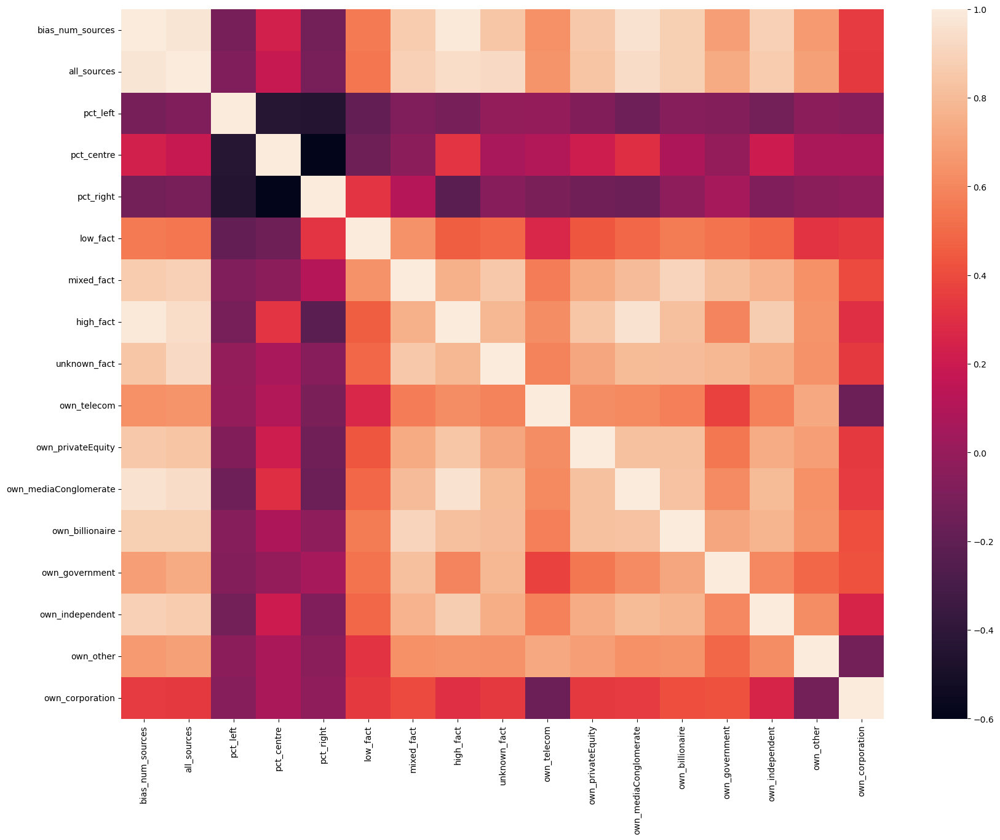

In [212]:
# Assuming `corr_matrix` is your correlation matrix
plt.figure(figsize=(20, 15))
heatmap = sns.heatmap(corr_matrix, annot=False)
plt.savefig('heatmap_no_numbers.png', dpi=300)

## Reducción de dimensionalidad

### Reducción de dimensionalidad mediante PCA (numéricas)

Para reducir la dimensionalidad del dataframe, aplicamos PCA a las variables numéricas, tratando aparte las categóricas.

Primero observamos cuántos componentes prrincipales explican la mayor parte de la variación dentro del dataset:

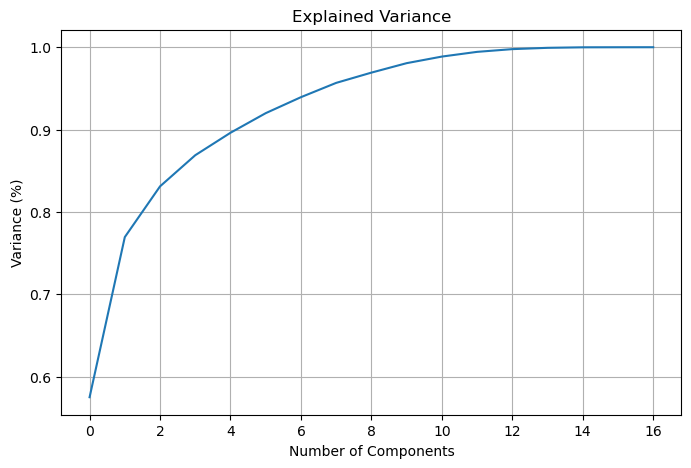

In [213]:
# Fit PCA on the data
pca = PCA().fit(clean_ground_news_df.iloc[:, :17])  # Hacemos el "fit" solo con las numéricas reales, no con las categóricas.


# Plotting the Cumulative Summation of the Explained Variance
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')  # for each component
plt.title('Explained Variance')
plt.grid(True)

# Set x-axis major ticks to multiple of 2
ax = plt.gca()  # Get the current Axes instance
ax.xaxis.set_major_locator(MultipleLocator(2))

plt.show()

Como el objetivo de este trabajo es sacar conclusiones más bien amplias y no tanto explicar toda la variabilidad, considero apropiado el número de componentes principales que explique el 90 % de la varianza. Esto resultan ser, según vemos en la gráfica, cuatro componentes principales.

Una vez decidido que se resumirán las variables numéricas a cuatro componentes principales procedemos a hacer la PCA propiamente dicha:

In [214]:
# Applying PCA
pca = PCA(n_components=4)  # Reduce to 2 dimensions for visualization
clean_ground_news_df_num_PCA = pca.fit_transform(clean_ground_news_df.iloc[:, :17])  # Solo con las numéricas.
principal_df = pd.DataFrame(data=clean_ground_news_df_num_PCA, columns=['PC1', 'PC2', 'PC3', 'PC4'])

# Explained Variance
explained_variance = pca.explained_variance_ratio_
print("Explained Variance of each Principal Component: ", explained_variance)



Explained Variance of each Principal Component:  [0.57509241 0.19440164 0.06159688 0.03780281]


#### Representación de los componentes principales:

Luego veremos qué pueden estar representando estos componentes principales. Pero si hacemos un pairplot entre ellos, podemos ver una cosa que llama la atención:

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



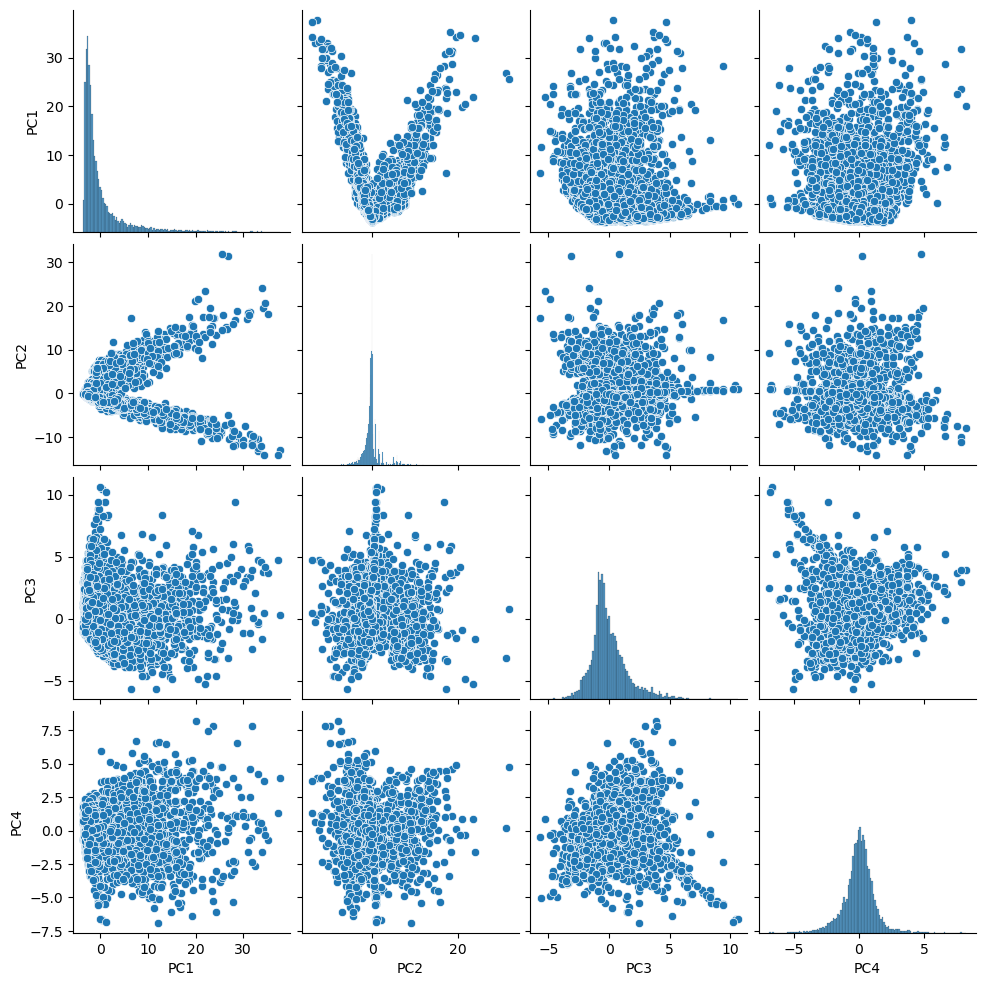

In [215]:
# Selecting the first four principal components
principal_df_subset = principal_df[['PC1', 'PC2', 'PC3', 'PC4']]

# Pairplot
sns.pairplot(principal_df_subset)
plt.show()

Podemos observar que hay algún tipo de doble correlación entre el componente principal uno y dos. Doble, porque es como si se desdoblase en dos: una parte de los puntos muestran una correlación positiva entre PC1 y PC2, mientras que otra parte de los puntos parecen mostrar una correlación inversa. Cuando hagamos el clustering esperemos salir de dudas y averiguar qué puede significar todo esto.

Con diferencia, este dibujo en forma de uve es lo más chocante de la representación. Si nos fijamos en el PC2, no obstante, llaman la atención una serie de puntos que parecen dibujar una línea recta horizontal, si miramos el gráfico de PC2 con PC3 y de PC2 con PC4.

Lo demás, ya sería hacer cábalas con que "quizá se ve una correlación inversa o directa muy leve entre este o este otro componente principal"... al que de momento no entro.

#### 3D plot con "hue"

Para representar 4 dimensiones, podemos hacer una representación 3D con algún elemento adicional (como por ejemplo la tonalidad de color):

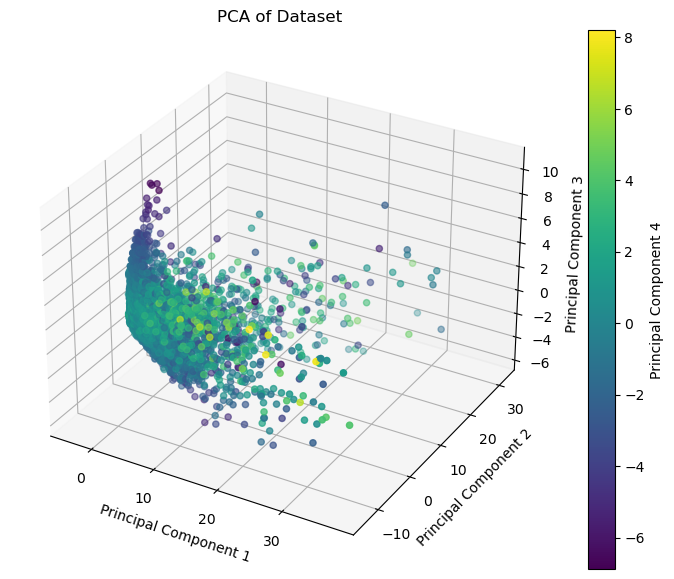

In [216]:
# Assuming you have a DataFrame `principal_df` with at least four principal components ('PC1', 'PC2', 'PC3', 'PC4')
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Use color map for the fourth dimension
scatter = ax.scatter(principal_df['PC1'], principal_df['PC2'], principal_df['PC3'], c=principal_df['PC4'], cmap='viridis')

# Adding labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('PCA of Dataset')

# Color bar to represent the fourth dimension's values
color_bar = plt.colorbar(scatter)
color_bar.set_label('Principal Component 4')

plt.show()

Podemos rotar la representación para observar desde otra perspectiva:

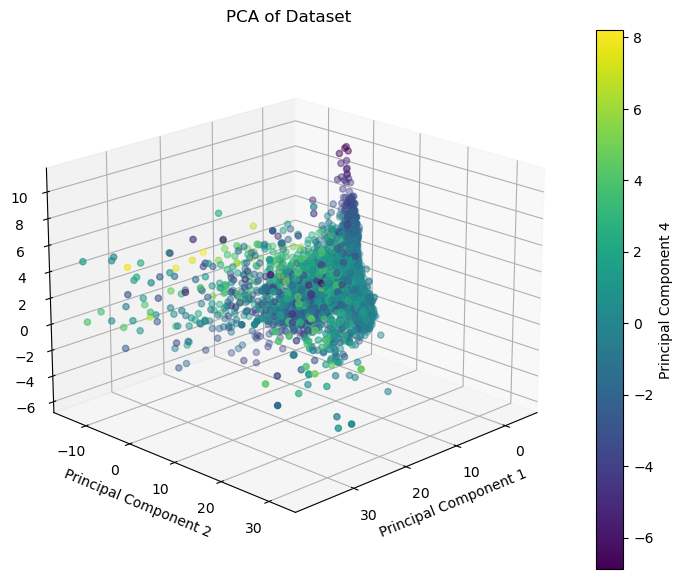

In [217]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have a DataFrame `principal_df` with at least four principal components ('PC1', 'PC2', 'PC3', 'PC4')
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Use color map for the fourth dimension
scatter = ax.scatter(principal_df['PC1'], principal_df['PC2'], principal_df['PC3'], c=principal_df['PC4'], cmap='viridis')

# Adding labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('PCA of Dataset')

# Color bar to represent the fourth dimension's values
color_bar = plt.colorbar(scatter)
color_bar.set_label('Principal Component 4')

# Set the view angle
ax.view_init(elev=20, azim=45)  # Adjust 'elev' and 'azim' to control the rotation

plt.show()

#### Representación interactiva en 3D con código de color ("hue")

Esta representación nos permite examinar un poco más lo que hemos visto antes, y el poder moverlo a voluntad nos aporta más comprensión de lo que vemos: 

In [218]:
import plotly.express as px

fig = px.scatter_3d(principal_df, x='PC1', y='PC2', z='PC3',
                    color='PC4',  # Represents the fourth dimension
                    title="PCA of Dataset",
                    size_max=5)  # Adjust the maximum size of the symbol
fig.show()

Del examinar dinámicamente la representación, vemos que hay una diferencia entre los dos "palitos" de la uve: hay una tendencia (no muy fuerte) a que los valores de PC4 sean más altos en una de ellas (donde se ven puntos amarillos).
    
Esta misma "pata" de la uve se caracteriza por aparecer como más "compacta" que la otra, que en cambio es más difusa en el extremo libre, y más gruesa en la "raíz" de la que salen ambos palitos.
    
    

In [219]:
principal_df

,PC1,PC2,PC3,PC4
0,-1.285179,-1.745164,0.076547,0.070152
1,4.926011,-2.585731,1.210826,0.033450
2,2.595723,-1.861419,1.303005,1.900980
3,0.160388,-1.645043,0.376920,2.792605
4,-0.554474,-1.178624,1.000822,1.872795
...,...,...,...,...
9164,2.767417,-1.746805,-2.876640,-2.299981
9165,22.735546,17.528792,-1.307737,3.941788
9166,-2.551632,-0.527076,0.308790,1.536547
9167,0.532353,-1.851264,1.682928,1.159888


### Dataframe con los componentes principales de las numéricas, y con las categóricas

In [220]:
stacked_df = pd.concat([principal_df, clean_ground_news_df.iloc[:, 17:]], axis=1)

In [221]:
stacked_df

,PC1,PC2,PC3,PC4,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title
0,-1.285179,-1.745164,0.076547,0.070152,0.0,0.0,0.0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,4.926011,-2.585731,1.210826,0.033450,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2.595723,-1.861419,1.303005,1.900980,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.160388,-1.645043,0.376920,2.792605,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,-0.554474,-1.178624,1.000822,1.872795,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9164,2.767417,-1.746805,-2.876640,-2.299981,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9165,22.735546,17.528792,-1.307737,3.941788,0.0,1.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9166,-2.551632,-0.527076,0.308790,1.536547,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9167,0.532353,-1.851264,1.682928,1.159888,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


## Clustering

Para el clustering (en k-means), aplicaremos el método del codo para decidir el número de clusters. Pero para eso necesitamos consolidar los dataframes resultantes del PCA y el MCA. Primero consolido el dataframe resultante del MCA (dado que el del PCA ya lo tenemos, se llama "principal_df").

#### Consolidación PCA + MCA

### k-means sin MCA

In [222]:
stacked_df  # El que incluye el PCA y las categóricas

,PC1,PC2,PC3,PC4,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title
0,-1.285179,-1.745164,0.076547,0.070152,0.0,0.0,0.0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,4.926011,-2.585731,1.210826,0.033450,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2.595723,-1.861419,1.303005,1.900980,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0.160388,-1.645043,0.376920,2.792605,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,-0.554474,-1.178624,1.000822,1.872795,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9164,2.767417,-1.746805,-2.876640,-2.299981,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9165,22.735546,17.528792,-1.307737,3.941788,0.0,1.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9166,-2.551632,-0.527076,0.308790,1.536547,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9167,0.532353,-1.851264,1.682928,1.159888,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages

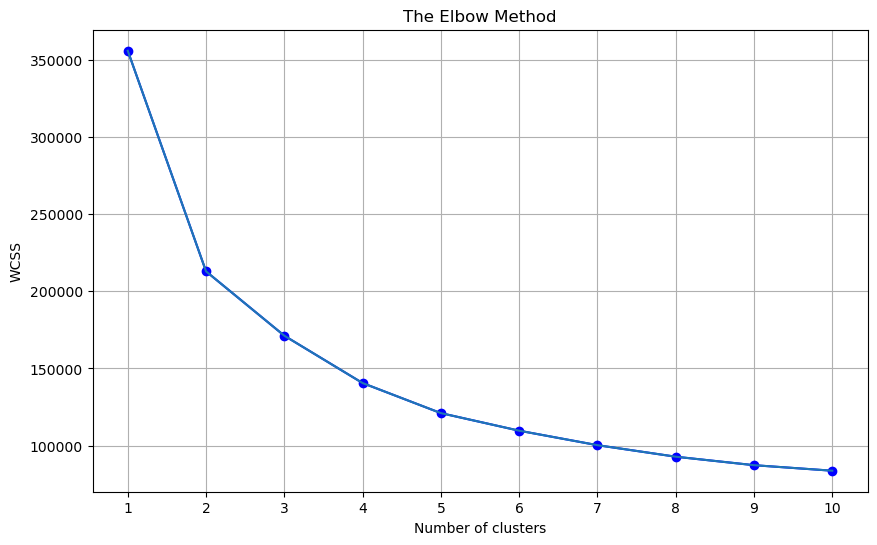

In [223]:
# Calculate WCSS for a range of number of clusters
wcss = []
for i in range(1, 11):  # Adjust the range as needed
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(stacked_df)
    wcss.append(kmeans.inertia_)

# Plot the results to observe the 'elbow'
plt.figure(figsize=(10, 6))  # Optional: Adjust figure size for better visibility
plt.plot(range(1, 11), wcss, marker='o', linestyle='-', color='b')  # Added marker for visualization
plt.plot(range(1, 11), wcss)  # Adjust the range as needed
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)  # Optional: Add grid for better readability
plt.xticks(range(1, 11))  # Ensure x-axis ticks match the range of cluster numbers
plt.show()

Decido que, dado que la premisa principal del trabajo se fundamenta en detectar diferencias entre la cobertura de noticias por parte de izquierda, derecha (y en tercer lugar, centro), que entre dos y tres clusters, la mejor opción en mi caso es tomar tres clusters, que esperaría que coincidieran en cierta medida con noticias con mayor cobertura por parte de la izquierda, de la derecha, o bien cobertura equilibrada.

In [228]:
# Apply K-means to the combined data
kmeans = KMeans(n_clusters=3, random_state=0)
clusters_kmeans = kmeans.fit_predict(stacked_df)

# Add cluster information back to the original dataframe
stacked_df['Clusters k-means'] = clusters_kmeans

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [229]:
## SILHOUETTE SCORE!!!
silhouette_avg_kmeans = silhouette_score(stacked_df, clusters_kmeans)
print("The average silhouette_score is :", silhouette_avg_kmeans)

The average silhouette_score is : 0.6169848311381558


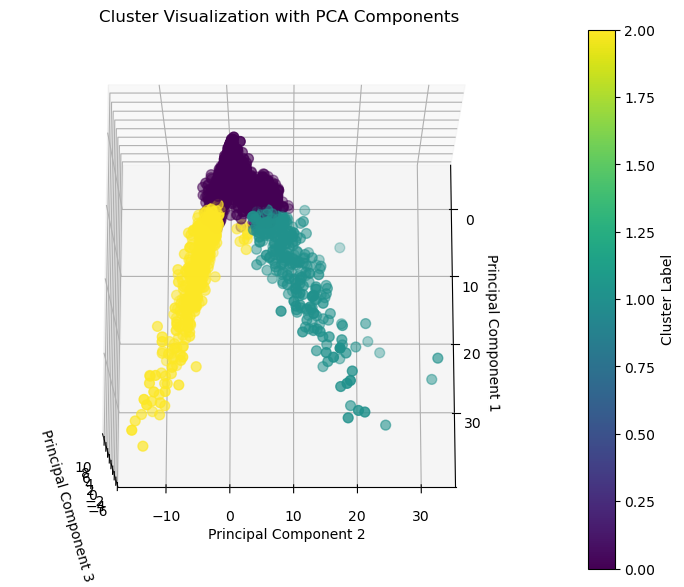

In [237]:
# Assuming `combined_df` contains your PCA components, MCA components, and the 'Clusters k-means' column
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Use the first three PCA components for the scatter plot axes
# Color-code the points by the cluster assignment from k-means
scatter = ax.scatter(stacked_df['PC1'], stacked_df['PC2'], stacked_df['PC3'], 
                     c=stacked_df['Clusters k-means'], cmap='viridis', s=50)  # s is the size of the points

# Adding labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('Cluster Visualization with PCA Components')

# Color bar to represent cluster labels
color_bar = plt.colorbar(scatter)
color_bar.set_label('Cluster Label')

# Set the view angle
ax.view_init(elev=75, azim=0)

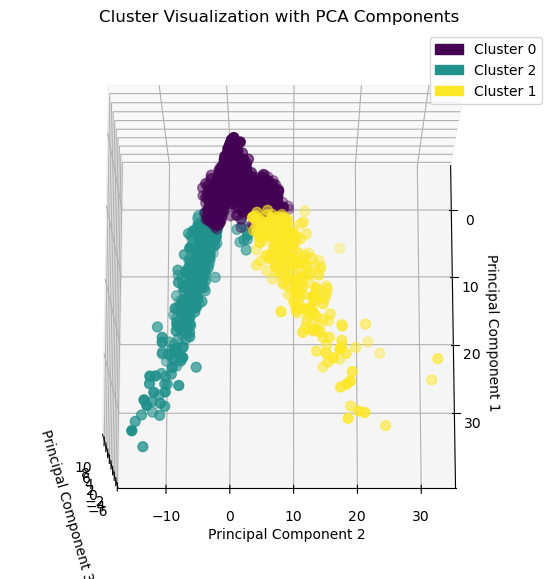

In [238]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # For custom legends

# Assuming `stacked_df` is your DataFrame containing 'PC1', 'PC2', 'PC3', and 'Clusters k-means'
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Unique cluster labels
clusters = stacked_df['Clusters k-means'].unique()

# Color map
cmap = plt.get_cmap('viridis')
colors = [cmap(i) for i in np.linspace(0, 1, len(clusters))]

# Plot each cluster with its own color
for cluster, color in zip(clusters, colors):
    # Filter rows by cluster
    cluster_data = stacked_df[stacked_df['Clusters k-means'] == cluster]
    ax.scatter(cluster_data['PC1'], cluster_data['PC2'], cluster_data['PC3'], 
               color=color, s=50, label=f'Cluster {cluster}')

# Adding labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('Cluster Visualization with PCA Components')

# Custom legend
legend_patches = [mpatches.Patch(color=color, label=f'Cluster {cluster}') for cluster, color in zip(clusters, colors)]
plt.legend(handles=legend_patches)

# Set the view angle
ax.view_init(elev=75, azim=0)

plt.show()

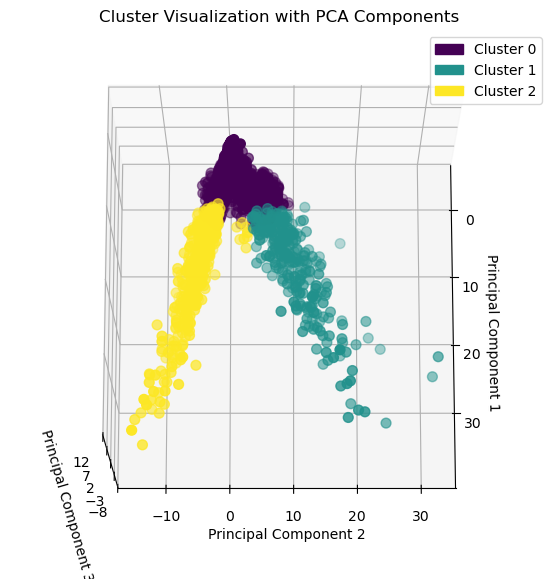

In [241]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Assuming `stacked_df` is your DataFrame containing 'PC1', 'PC2', 'PC3', and 'Clusters k-means'
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Unique cluster labels sorted
clusters = np.sort(stacked_df['Clusters k-means'].unique())

# Color map
cmap = plt.get_cmap('viridis')
colors = [cmap(i) for i in np.linspace(0, 1, len(clusters))]

# Plot each cluster with its own color
for cluster, color in zip(clusters, colors):
    # Filter rows by cluster
    cluster_data = stacked_df[stacked_df['Clusters k-means'] == cluster]
    ax.scatter(cluster_data['PC1'], cluster_data['PC2'], cluster_data['PC3'], 
               color=color, s=50, label=f'Cluster {cluster}')

# Adding labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('Cluster Visualization with PCA Components')

# Custom legend
legend_patches = [mpatches.Patch(color=color, label=f'Cluster {cluster}') for cluster, color in zip(clusters, colors)]
plt.legend(handles=legend_patches)

# Reduce the number of ticks on the Z-axis
ax.set_zticks(np.linspace(min(ax.get_zticks()), max(ax.get_zticks()), 5))

# Set the view angle
ax.view_init(elev=75, azim=0)

plt.show()


In [239]:
# Assuming 'combined_df' contains your PCA components, MCA components, and 'Clusters k-means' column
fig = px.scatter_3d(stacked_df, x='PC1', y='PC2', z='PC3',
                    color='Clusters k-means',  # Color-code by cluster labels
                    title="Cluster Visualization with PCA Components",
                    color_continuous_scale=px.colors.qualitative.D3)  # Use a qualitative color scale for discrete values

# Optional: Customize the color scale for better visual distinction between clusters
# If you have a specific color scheme in mind, you can specify it directly, e.g.,
# color_continuous_scale=['blue', 'green', 'red']

fig.update_traces(marker=dict(size=5))  # Adjust the size of the points

fig.show()

### Clustering jerárquico

#### Dendrograma

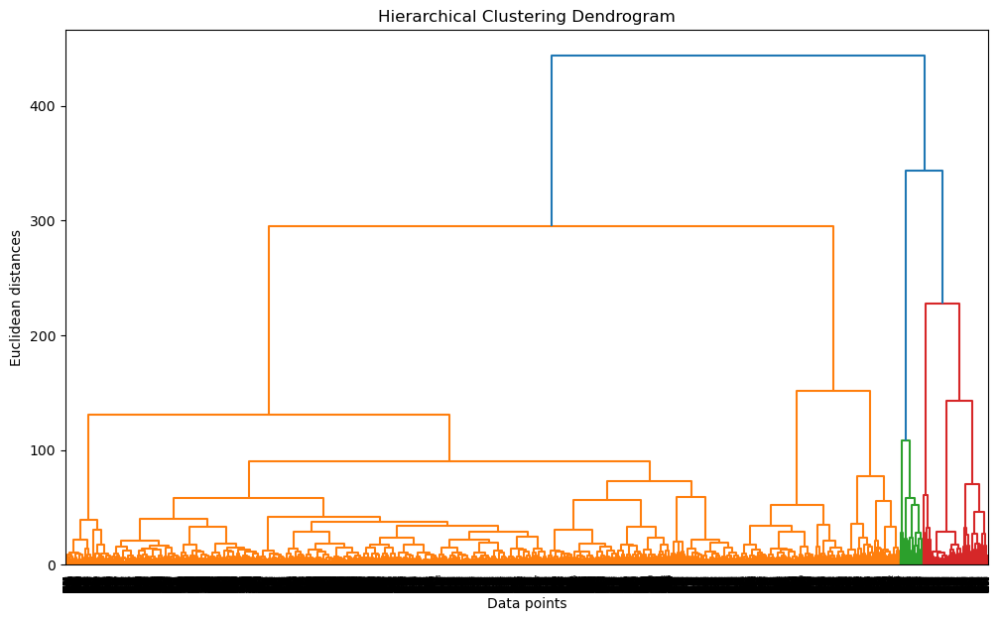

In [242]:
# Generate the linkage matrix
Z = sch.linkage(stacked_df, method='ward')  # 'ward' is one of the methods you can use

# Plot the dendrogram to visualize the clustering
plt.figure(figsize=(12, 7))
dendrogram = sch.dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data points')
plt.ylabel('Euclidean distances')
plt.show()

Aparte de un clustering con 3 clusters, se prueba también con 4 y 5, pero los resultados son peores.

In [247]:
# Hacemos el clustering
hc = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
clusters_hc = hc.fit_predict(stacked_df)

# Añadimos los clusters al dataframe original
stacked_df['Clusters_HC'] = clusters_hc

## SILHOUETTE SCORE!!!
silhouette_avg_hc = silhouette_score(stacked_df, clusters_hc)
print("The average silhouette_score is :", silhouette_avg_hc)

C:\Users\karel\anaconda3\envs\py3.8.13\lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



The average silhouette_score is : 0.5565066404304301


In [248]:
# Assuming 'combined_df' contains your PCA components, MCA components, and 'Clusters k-means' column
fig = px.scatter_3d(stacked_df, x='PC1', y='PC2', z='PC3',
                    color='Clusters_HC',  # Color-code by cluster labels
                    title="HC Cluster Visualization with PCA Components",
                    color_continuous_scale=px.colors.qualitative.D3)  # Use a qualitative color scale for discrete values

# Optional: Customize the color scale for better visual distinction between clusters
# If you have a specific color scheme in mind, you can specify it directly, e.g.,
# color_continuous_scale=['blue', 'green', 'red']

fig.update_traces(marker=dict(size=5))  # Adjust the size of the points

fig.show()

#### Spectral Clustering

In [249]:
from sklearn.cluster import SpectralClustering
import matplotlib.pyplot as plt

# Assuming 'facebook_tailandia_final' is your data

# Apply Spectral Clustering
n_clusters = 3  # Define the number of clusters
spectral_model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors')
clusters_sc = spectral_model.fit_predict(stacked_df)

# Adding the clusters to the original dataframe
stacked_df['Clusters_SC'] = clusters_sc


In [250]:
# Assuming 'combined_df' contains your PCA components, MCA components, and 'Clusters k-means' column
fig = px.scatter_3d(stacked_df, x='PC1', y='PC2', z='PC3',
                    color='Clusters_SC',  # Color-code by cluster labels
                    title="SC Cluster Visualization with PCA Components",
                    color_continuous_scale=px.colors.qualitative.D3)  # Use a qualitative color scale for discrete values

# Optional: Customize the color scale for better visual distinction between clusters
# If you have a specific color scheme in mind, you can specify it directly, e.g.,
# color_continuous_scale=['blue', 'green', 'red']

fig.update_traces(marker=dict(size=5))  # Adjust the size of the points

fig.show()

In [251]:
## SILHOUETTE SCORE!!!
silhouette_avg_sc = silhouette_score(stacked_df, clusters_sc)
print("The average silhouette_score is :", silhouette_avg_sc)

The average silhouette_score is : 0.5751596858631686


#### Gaussian Mixture

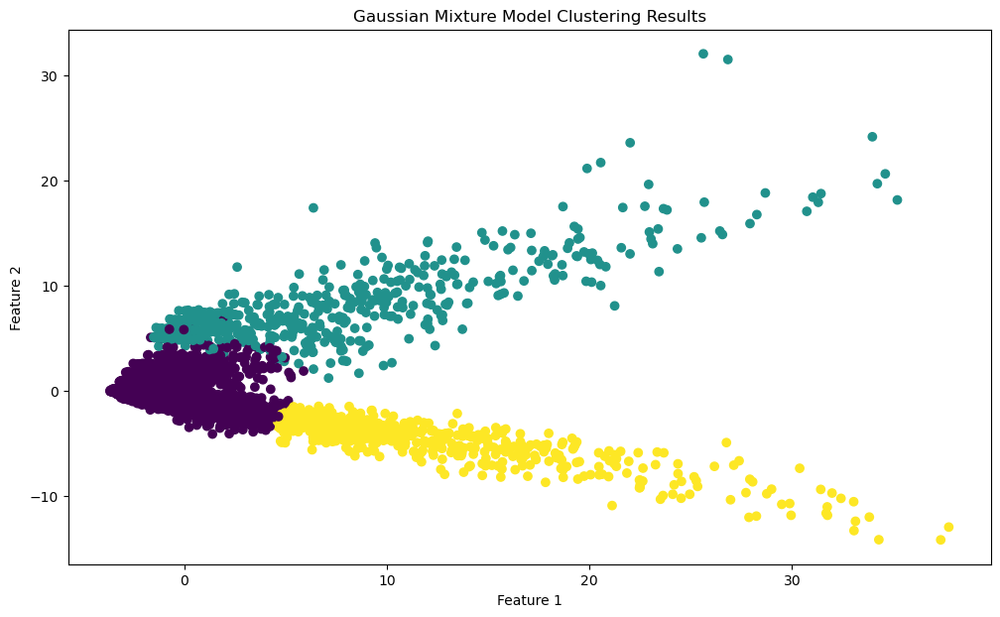

In [255]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import numpy as np

n_clusters = 3  # Define the number of components/clusters
gmm = GaussianMixture(n_components=n_clusters, random_state=0)
gmm.fit(stacked_df)
clusters_gmm = gmm.predict(stacked_df)

# Adding the clusters to the original dataframe
stacked_df['Clusters_GMM'] = clusters_gmm

# Plot the clusters (optional, and requires 2D data or PCA/t-SNE for higher dimensions)
# This is an illustrative example if your data is 2D. For higher-dimensional data, consider reducing the dimensionality first.
plt.figure(figsize=(12, 7))
plt.scatter(stacked_df.iloc[:, 0], stacked_df.iloc[:, 1], c=clusters_gmm, cmap='viridis')
plt.title('Gaussian Mixture Model Clustering Results')
plt.xlabel('Feature 1')  # Adjust based on your data
plt.ylabel('Feature 2')  # Adjust based on your data
plt.show()

In [253]:
# Assuming 'combined_df' contains your PCA components, MCA components, and 'Clusters k-means' column
fig = px.scatter_3d(stacked_df, x='PC1', y='PC2', z='PC3',
                    color='Clusters_GMM',  # Color-code by cluster labels
                    title="HC Cluster Visualization with PCA Components",
                    color_continuous_scale=px.colors.qualitative.D3)  # Use a qualitative color scale for discrete values

# Optional: Customize the color scale for better visual distinction between clusters
# If you have a specific color scheme in mind, you can specify it directly, e.g.,
# color_continuous_scale=['blue', 'green', 'red']

fig.update_traces(marker=dict(size=5))  # Adjust the size of the points

fig.show()

In [256]:
## SILHOUETTE SCORE!!!
silhouette_avg_gmm = silhouette_score(stacked_df, clusters_gmm)
print("The average silhouette_score is :", silhouette_avg_gmm)

The average silhouette_score is : 0.5829270702101578


Ninguna de las clusterizaciones efectuadas mejora a la hecha mediante k-means (aunque se acercan).
Decidimos quedarnos con la hecha mediante k-means.

## Análisis e interpretación de los clusters obtenidos

Para facilitar la interpretación, nos ayudaremos del dataframe anterior a la aplicación de RobustScaler a las variables numéricas:

In [259]:
# Dataframe pre-transformación:
untransformed_ground_news_df = pd.read_pickle('updated_ground_news_with_subject_countries_sentiment_df.pkl')
untransformed_ground_news_df

,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title
0,15.0,27.0,33.0,47.0,20.0,1.0,2.0,13.0,11.0,4.0,2.0,2.0,2.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,76.0,88.0,33.0,38.0,29.0,2.0,25.0,48.0,13.0,3.0,11.0,30.0,11.0,6.0,16.0,11.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,46.0,57.0,30.0,31.0,39.0,0.0,25.0,22.0,10.0,3.0,8.0,13.0,12.0,7.0,8.0,7.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,23.0,29.0,52.0,35.0,13.0,0.0,7.0,16.0,6.0,2.0,7.0,10.0,2.0,7.0,2.0,9.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
4,18.0,32.0,50.0,17.0,33.0,0.0,11.0,8.0,12.0,1.0,2.0,6.0,6.0,3.0,3.0,7.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9164,91.0,113.0,20.0,76.0,4.0,0.0,1.0,88.0,24.0,0.0,11.0,39.0,5.0,0.0,20.0,6.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9165,210.0,358.0,31.0,45.0,24.0,3.0,71.0,135.0,149.0,0.0,16.0,112.0,29.0,18.0,20.0,3.0,22.0,0.0,1.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9166,9.0,9.0,100.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9167,27.0,28.0,63.0,18.0,19.0,2.0,20.0,6.0,0.0,2.0,2.0,8.0,8.0,2.0,3.0,11.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Ahora, a la luz del clustering obtenido, y de que podemos relacionarlos con los datos originales, examinemos los clusters 0, 1 y 2, incluyendo complementariamente la PCA:

In [264]:
ground_news_cluster_interpretation_df = pd.concat([principal_df, untransformed_ground_news_df, stacked_df['Clusters k-means']], axis=1)
ground_news_cluster_interpretation_df

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
0,-1.285179,-1.745164,0.076547,0.070152,15.0,27.0,33.0,47.0,20.0,1.0,2.0,13.0,11.0,4.0,2.0,2.0,2.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,4.926011,-2.585731,1.210826,0.033450,76.0,88.0,33.0,38.0,29.0,2.0,25.0,48.0,13.0,3.0,11.0,30.0,11.0,6.0,16.0,11.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
2,2.595723,-1.861419,1.303005,1.900980,46.0,57.0,30.0,31.0,39.0,0.0,25.0,22.0,10.0,3.0,8.0,13.0,12.0,7.0,8.0,7.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0.160388,-1.645043,0.376920,2.792605,23.0,29.0,52.0,35.0,13.0,0.0,7.0,16.0,6.0,2.0,7.0,10.0,2.0,7.0,2.0,9.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4,-0.554474,-1.178624,1.000822,1.872795,18.0,32.0,50.0,17.0,33.0,0.0,11.0,8.0,12.0,1.0,2.0,6.0,6.0,3.0,3.0,7.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9164,2.767417,-1.746805,-2.876640,-2.299981,91.0,113.0,20.0,76.0,4.0,0.0,1.0,88.0,24.0,0.0,11.0,39.0,5.0,0.0,20.0,6.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
9165,22.735546,17.528792,-1.307737,3.941788,210.0,358.0,31.0,45.0,24.0,3.0,71.0,135.0,149.0,0.0,16.0,112.0,29.0,18.0,20.0,3.0,22.0,0.0,1.0,0.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
9166,-2.551632,-0.527076,0.308790,1.536547,9.0,9.0,100.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9167,0.532353,-1.851264,1.682928,1.159888,27.0,28.0,63.0,18.0,19.0,2.0,20.0,6.0,0.0,2.0,2.0,8.0,8.0,2.0,3.0,11.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


### Cluster 0

In [265]:
ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 0].describe()

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
count,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.00000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.000000,8201.0
mean,-1.349490,0.006620,0.011060,0.000705,24.142909,31.563224,33.954518,43.922814,22.073893,0.458846,5.584563,17.925741,7.682722,0.478478,2.396171,11.669796,3.728448,0.884892,2.846970,1.853311,0.561029,0.002073,0.051701,0.099378,0.266065,0.276308,0.222778,0.264114,0.236800,0.700159,0.142787,0.015608,0.217413,0.088770,0.123278,0.139007,0.103646,0.096939,0.026704,0.040239,0.099744,0.064870,0.044263,0.072430,0.059383,0.052555,0.023656,0.040483,0.006463,0.285453,0.785392,0.07621,0.080234,0.069260,0.065724,0.038410,0.036581,0.021583,0.018047,0.015730,0.011584,0.011096,0.010365,0.009999,0.009145,0.008414,0.007682,0.006341,0.005975,0.005975,0.006828,0.005121,0.004756,0.004634,0.006341,0.006341,0.094866,0.344958,0.062675,0.383734,0.0
std,1.842220,1.575983,1.469985,0.993081,20.309863,26.957069,18.020781,19.928629,20.272182,1.076261,5.109217,17.959527,9.765547,0.905569,3.089396,12.439727,3.036651,1.744585,3.279704,2.888213,1.542792,0.045485,0.221436,0.299187,0.441926,0.447198,0.416136,0.440887,0.425145,0.458216,0.349877,0.123960,0.412511,0.284428,0.328776,0.345975,0.304819,0.295893,0.161227,0.196531,0.299677,0.246312,0.205691,0.259215,0.236355,0.223156,0.151983,0.197101,0.080135,0.451657,0.410575,0.26535,0.271672,0.253911,0.247814,0.192196,0.187742,0.145325,0.133128,0.124436,0.107010,0.104759,0.101284,0.099499,0.095198,0.091345,0.087315,0.079380,0.077071,0.077071,0.082357,0.071384,0.068800,0.067917,0.079380,0.079380,0.293048,0.475384,0.242393,0.486324,0.0
min,-3.659507,-4.105254,-3.802413,-6.824735,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

El cluster 0 es el más numeroso, y reune noticias con una menor cobertura que las demás.

Probablemente por ese mismo motivo, es el cluster que reúne al menos algunas noticias que tienen un 100 % de cobertura de medios de centro, de izquierda o de derecha. Hay noticias con un número de fuentes mínimo, incluso solo cubiertas por un solo medio.

In [293]:
cluster_0_sum = pd.DataFrame(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 0].iloc[:, 21:].sum(), columns=["Cluster 0"])
cluster_0_sum


,Cluster 0
top_story,17.0
breaking_story,424.0
highlighted_blindspot,815.0
es_finde,2182.0
season_invierno,2266.0
season_otoño,1827.0
season_primavera,2166.0
season_verano,1942.0
politics,5742.0
social,1171.0


### Cluster 1

In [266]:
ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 1].describe()

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
count,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.0,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.0,285.000000,285.000000,285.000000,285.0,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.000000,285.00000,285.0
mean,12.445071,10.177757,0.085373,0.237659,139.929825,197.929825,30.126316,47.291228,22.582456,4.017544,38.143860,95.971930,64.231579,0.0,14.192982,71.428070,19.964912,10.715789,14.870175,1.214035,12.564912,0.028070,0.852632,0.0,0.277193,0.536842,0.375439,0.0,0.087719,0.870175,0.119298,0.031579,0.129825,0.077193,0.224561,0.336842,0.042105,0.049123,0.017544,0.038596,0.091228,0.049123,0.049123,0.091228,0.052632,0.042105,0.010526,0.073684,0.007018,0.357895,0.729825,0.108772,0.042105,0.077193,0.028070,0.021053,0.171930,0.122807,0.028070,0.014035,0.045614,0.007018,0.042105,0.021053,0.007018,0.003509,0.010526,0.014035,0.014035,0.007018,0.010526,0.014035,0.017544,0.010526,0.003509,0.007018,0.070175,0.421053,0.052632,0.40000,1.0
std,6.746408,4.226826,2.585563,2.325815,61.926143,96.027149,5.586532,9.318849,6.778516,3.538974,19.379194,42.546486,40.780273,0.0,6.764756,33.882241,8.031112,6.581552,7.112822,1.198508,5.151251,0.165464,0.355096,0.0,0.448400,0.499518,0.485088,0.0,0.283384,0.336702,0.324709,0.175184,0.336702,0.267367,0.418027,0.473462,0.201183,0.216505,0.131517,0.192970,0.288440,0.216505,0.216505,0.288440,0.223690,0.201183,0.102236,0.261716,0.083623,0.480224,0.444831,0.311901,0.201183,0.267367,0.165464,0.143812,0.377983,0.328793,0.165464,0.117842,0.209014,0.083623,0.201183,0.143812,0.083623,0.059235,0.102236,0.117842,0.117842,0.083623,0.102236,0.117842,0.131517,0.102236,0.059235,0.083623,0.255892,0.494596,0.223690,0.49076,0.0
min,2.614137,3.767443,-5.668548,-6.880086,30.000000,5.000000,11.000000,24.000000,6.000000,0.000000,5.000000,18.000000,5.000000,0.0,1.000000,16.000000,6.000000,0.000000,1.000000,0.000000,4.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.0
25%,7.376148,7.240587,-1.826501,-1.365709,92.000000,134.000000,26.00000

In [295]:
cluster_1_sum = pd.DataFrame(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 1].iloc[:, 21:].sum(), columns=["Cluster 1"])
cluster_1_sum

,Cluster 1
top_story,8.0
breaking_story,243.0
highlighted_blindspot,0.0
es_finde,79.0
season_invierno,153.0
season_otoño,107.0
season_primavera,0.0
season_verano,25.0
politics,248.0
social,34.0


En este caso vemos que se trata de un grupo de noticias con mucha más cobertura, de hecho los máximos absolutos de cobertura se dan en este cluster. Observamos un cierto sesgo de que más noticias están aquí cubiertas por medios de izquierda que de derecha, en promedio, pero eso parece ser un sesgo en el dataset completo, realmente.

### Cluster 2

In [267]:
ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 2].describe()

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
count,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.0
mean,11.010726,-4.326431,-0.168431,-0.107633,147.122987,208.503660,30.341142,51.247438,18.411420,2.424597,32.483163,110.751098,61.456808,4.508053,15.894583,72.723280,17.746706,6.805271,18.364568,16.944363,0.051245,0.001464,0.124451,0.002928,0.206442,0.395315,0.052709,0.364568,0.187408,0.740849,0.120059,0.026354,0.202050,0.109810,0.127379,0.172767,0.090776,0.284041,0.020498,0.065886,0.150805,0.101025,0.040996,0.117130,0.055637,0.084919,0.007321,0.067350,0.007321,0.325037,0.838946,0.096633,0.057101,0.073206,0.021962,0.060029,0.011713,0.007321,0.020498,0.019034,0.004392,0.010249,0.002928,0.011713,0.011713,0.014641,0.005857,0.014641,0.016105,0.016105,0.002928,0.004392,0.005857,0.008785,0.008785,0.005857,0.105417,0.379209,0.067350,0.374817,2.0
std,6.379560,2.223686,2.060136,2.476445,63.729101,97.352932,6.032599,10.108008,6.723203,2.360745,16.941185,49.530933,38.598115,2.828610,7.617160,33.647358,7.217726,5.678211,9.604055,10.228754,0.414556,0.038264,0.330337,0.054074,0.405048,0.489277,0.223615,0.481662,0.390525,0.438490,0.325268,0.160304,0.401823,0.312881,0.333642,0.378323,0.287501,0.451287,0.141799,0.248264,0.358121,0.301583,0.198425,0.321811,0.229387,0.278966,0.085309,0.250811,0.085309,0.468732,0.367850,0.295673,0.232206,0.260666,0.146667,0.237715,0.107670,0.085309,0.141799,0.136743,0.066178,0.100791,0.054074,0.107670,0.107670,0.120200,0.076359,0.120200,0.125973,0.125973,0.054074,0.066178,0.076359,0.093383,0.093383,0.076359,0.307315,0.485546,0.250811,0.484430,0.0
min,4.548838,-14.155346,-5.651858,-6.357802,44.000000,70.000000,15.000000,20.000000,1.000000,0.000000,4.000000,23.000000,2.000000,0.000000,1.000000,19.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0


No hay own_telecom. Hay muy poco own_other. Sí hay own_corporation.

No hay blindspots. Aunque es muy minoritario, ínfimo, es el cluster con más "top stories'.

In [301]:
cluster_2_sum = pd.DataFrame(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 2].iloc[:, 21:].sum(), columns=["Cluster 2"])
cluster_2_sum

,Cluster 2
top_story,1.0
breaking_story,85.0
highlighted_blindspot,2.0
es_finde,141.0
season_invierno,270.0
season_otoño,36.0
season_primavera,249.0
season_verano,128.0
politics,506.0
social,82.0


#### Viendo los tres clusters desde las categóricas:

Categóricas de cada cluster (suma):

In [329]:
combined_sum_df = pd.concat([cluster_0_sum, cluster_1_sum, cluster_2_sum], axis=1)
combined_sum_df
# Ordenado en función del Cluster 0:
#combined_sum_df_sorted = combined_sum_df.sort_values(by='Cluster 0', ascending=False)

#combined_sum_df_sorted

,Cluster 0,Cluster 1,Cluster 2
top_story,17.0,8.0,1.0
breaking_story,424.0,243.0,85.0
highlighted_blindspot,815.0,0.0,2.0
es_finde,2182.0,79.0,141.0
season_invierno,2266.0,153.0,270.0
season_otoño,1827.0,107.0,36.0
season_primavera,2166.0,0.0,249.0
season_verano,1942.0,25.0,128.0
politics,5742.0,248.0,506.0
social,1171.0,34.0,82.0


In [ ]:
#Aquí hacer wordcloud ABSOLUTO:

In [ ]:
# Assuming combined_sum_df is your DataFrame

# Function to generate a word cloud from a series
def generate_wordcloud(series, title):
    # Convert series to dictionary with words as keys and frequencies as values
    word_frequencies = series.to_dict()
    # Create a word cloud
    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate_from_frequencies(word_frequencies)
    # Plot
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Generate word clouds for each cluster
for cluster in ["Cluster 0", "Cluster 1", "Cluster 2"]:
    generate_wordcloud(combined_sum_df[cluster], f'Word Cloud for {cluster}')

Categóricas de cada clúster (ratio): dividimos la suma de cada categórica entre el número total de noticias del cluster.

In [331]:
# Calculate the ratios
cluster_0_ratio = cluster_0_sum / len(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 0])
cluster_1_ratio = cluster_1_sum / len(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 1])
cluster_2_ratio = cluster_2_sum / len(ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 2])

# Ensure the column names are correctly set for concatenation
cluster_0_ratio.columns = ['Cluster 0']
cluster_1_ratio.columns = ['Cluster 1']
cluster_2_ratio.columns = ['Cluster 2']

# Concatenate horizontally
combined_ratio_df = pd.concat([cluster_0_ratio, cluster_1_ratio, cluster_2_ratio], axis=1)
combined_ratio_df

# Ordenado en función del Cluster 0:
# combined_ratio_df_sorted = combined_ratio_df.sort_values(by='Cluster 0', ascending=False)
# combined_ratio_df_sorted

,Cluster 0,Cluster 1,Cluster 2
top_story,0.002073,0.028070,0.001464
breaking_story,0.051701,0.852632,0.124451
highlighted_blindspot,0.099378,0.000000,0.002928
es_finde,0.266065,0.277193,0.206442
season_invierno,0.276308,0.536842,0.395315
season_otoño,0.222778,0.375439,0.052709
season_primavera,0.264114,0.000000,0.364568
season_verano,0.236800,0.087719,0.187408
politics,0.700159,0.870175,0.740849
social,0.142787,0.119298,0.120059


In [ ]:
Aquí hacer WORDCLOUD RELATIVO:    COLOR DIFERENTE ENTRE CONTENTIOUS Y NO CONTENTIOUS

#### Highlights

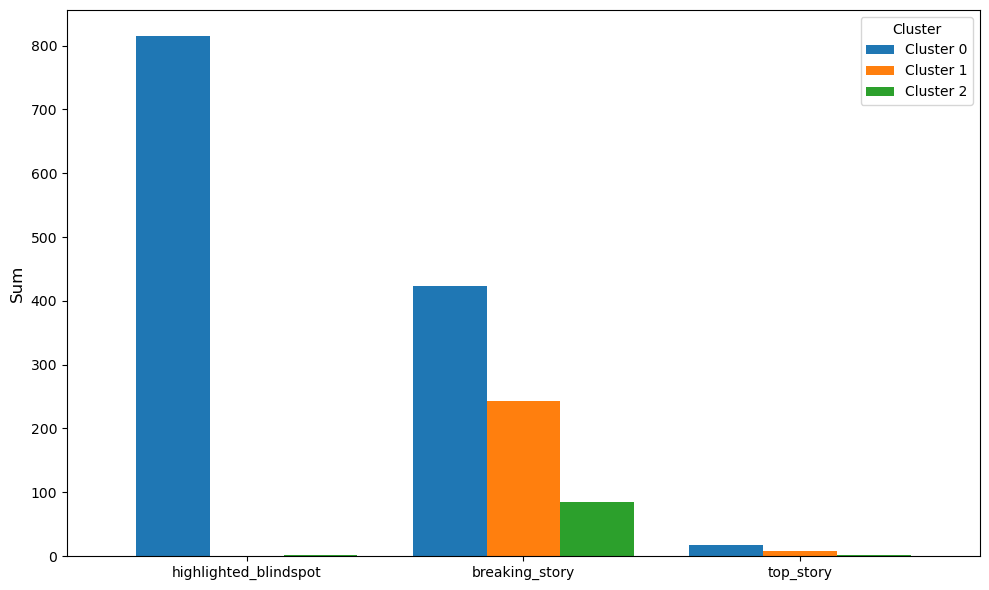

In [451]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_sum_df.iloc[:3, :].sort_values(by='Cluster 0', ascending=False).plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
# ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Sum', fontsize=12)
#ax.set_title('Highlights by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

Nos encontramos con que hay un sesgo muy grande debido a la diferencia en la cantidad de artículos que hay entre los clusters 0 por un lado, y 1 y 2 por el otro. Hagamos la representación en base a la ratio de estas categóricas. Es decir, el dividir el número de veces que la categórica es igual a uno en cada clúster, dividido entre el número de artículos que contiene el cluster:

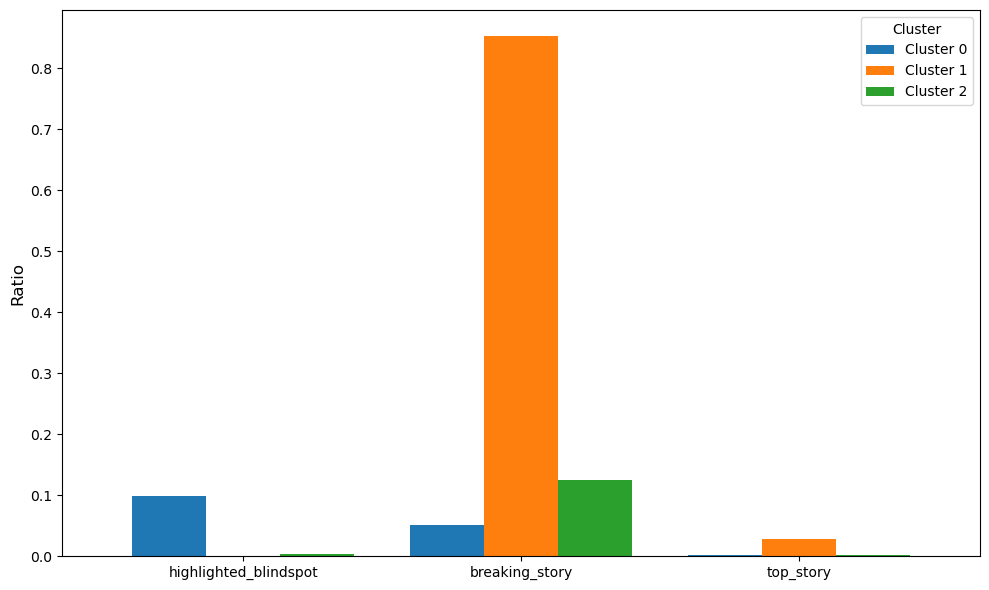

In [453]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_ratio_df.iloc[:3, :].sort_values(by='Cluster 0', ascending=False).plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
# ax.set_xlabel('Highlights', fontsize=12)
ax.set_ylabel('Ratio', fontsize=12)
#ax.set_title('Highlights Ratio by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

#### Time variables

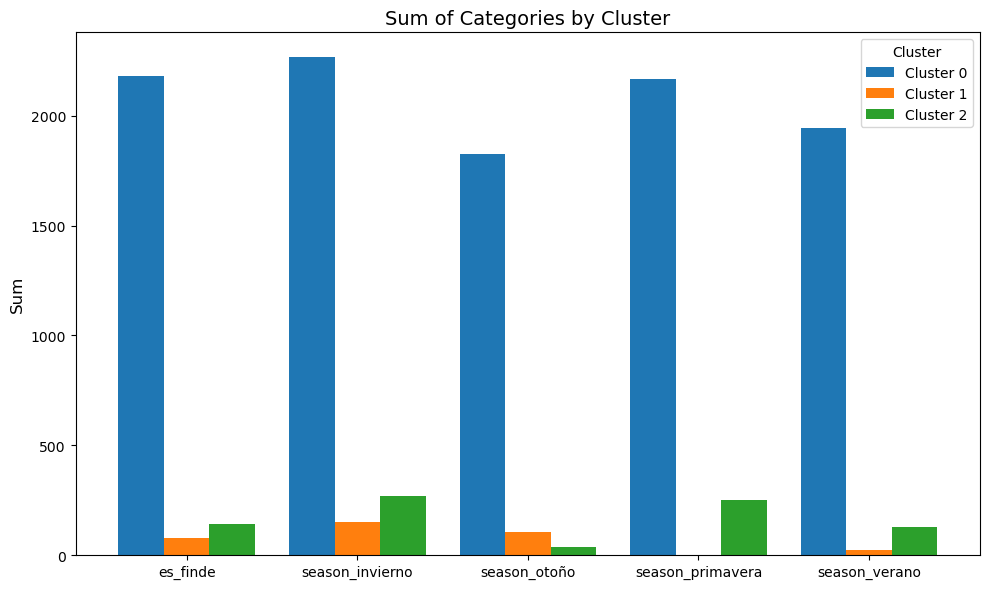

In [444]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_sum_df.iloc[3:8, :].plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
#ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Sum', fontsize=12)
ax.set_title('Sum of Categories by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

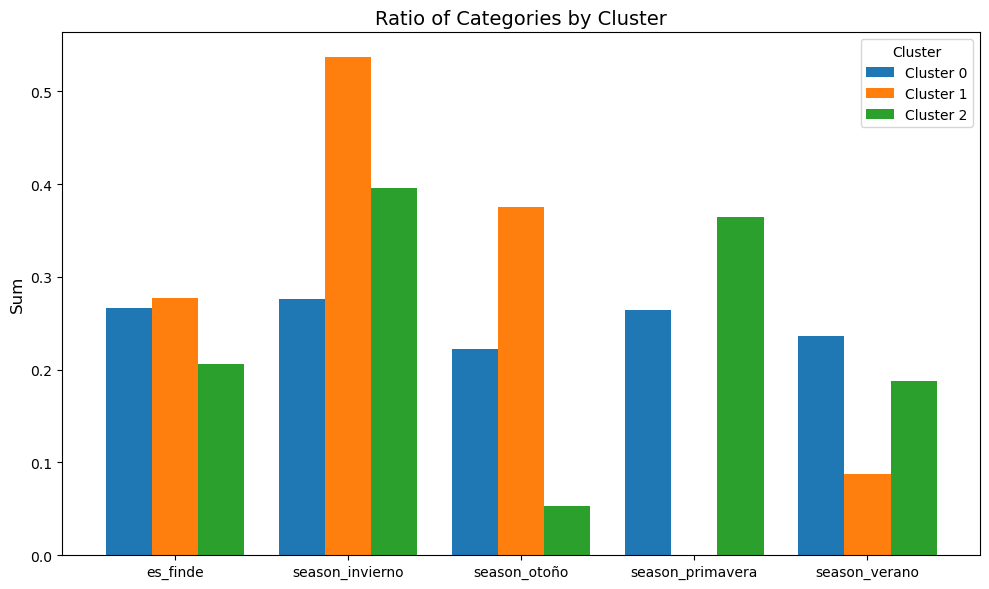

In [443]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_ratio_df.iloc[3:8, :].plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
#ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Sum', fontsize=12)
ax.set_title('Ratio of Categories by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

#### Subjects

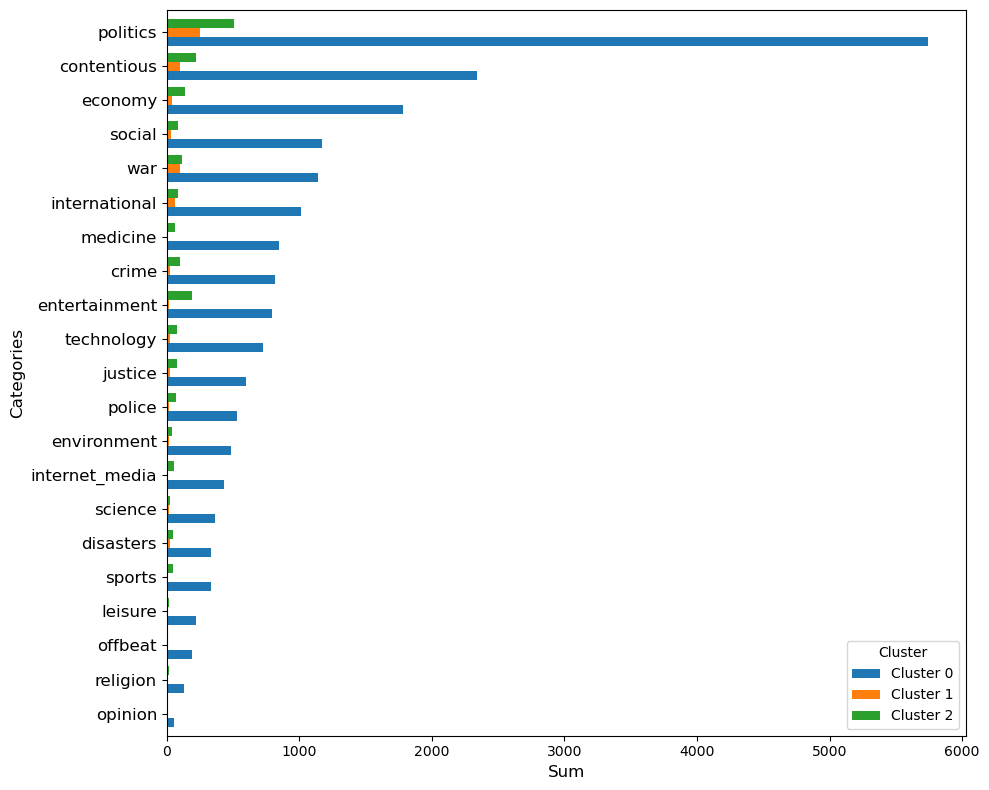

In [455]:
# Adjusting to select rows from 3 to 23 and plot horizontally
ax = combined_sum_df.iloc[8:29, :].sort_values(by='Cluster 0', ascending=True).plot(kind='barh', figsize=(10, 8), width=0.8)

# Setting labels and title (switching x and y labels because it's a horizontal plot)
ax.set_ylabel('Categories', fontsize=12)  # Now the y-axis represents categories
ax.set_xlabel('Sum', fontsize=12)  # x-axis represents the sum
#ax.set_title('Sum of Categories by Cluster for Rows 3 to 23', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

# Adjusting ticks on the y-axis
plt.yticks(fontsize=12)  # No need for rotation as it's a horizontal plot

plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

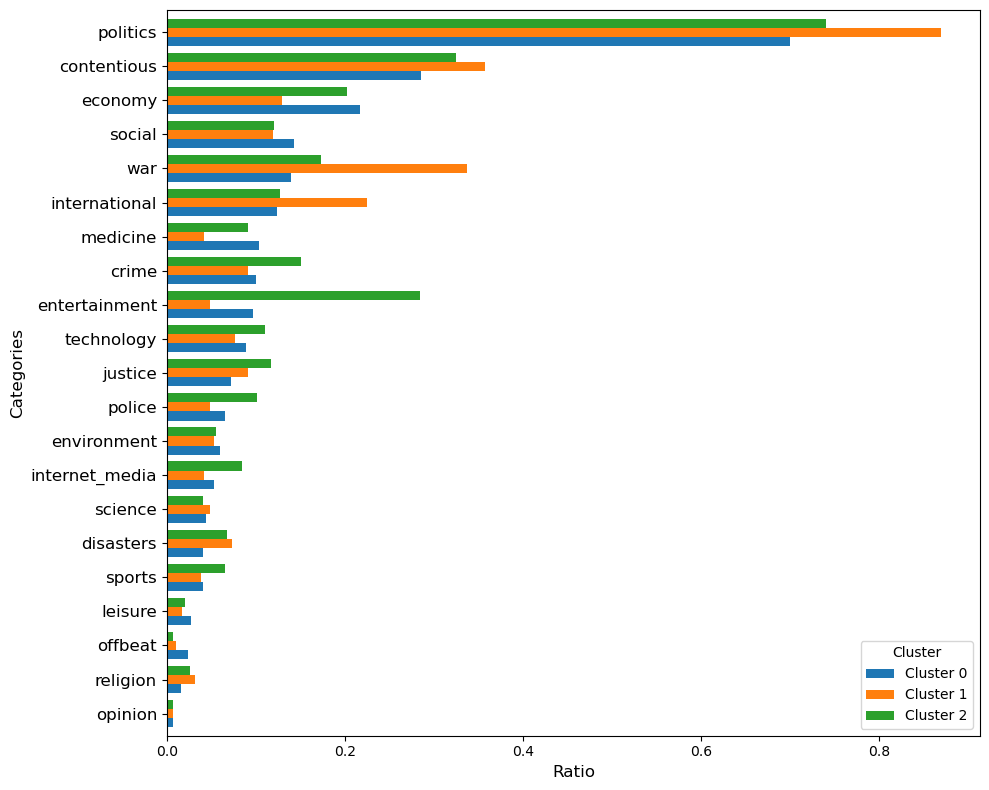

In [456]:
# Adjusting to select rows from 3 to 23 and plot horizontally
ax = combined_ratio_df.iloc[8:29, :].sort_values(by='Cluster 0', ascending=True).plot(kind='barh', figsize=(10, 8), width=0.8)

# Setting labels and title (switching x and y labels because it's a horizontal plot)
ax.set_ylabel('Categories', fontsize=12)  # Now the y-axis represents categories
ax.set_xlabel('Ratio', fontsize=12)  # x-axis represents the sum
# ax.set_title('Sum of Categories by Cluster for Rows 3 to 23', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

# Adjusting ticks on the y-axis
plt.yticks(fontsize=12)  # No need for rotation as it's a horizontal plot

plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

#### Countries:

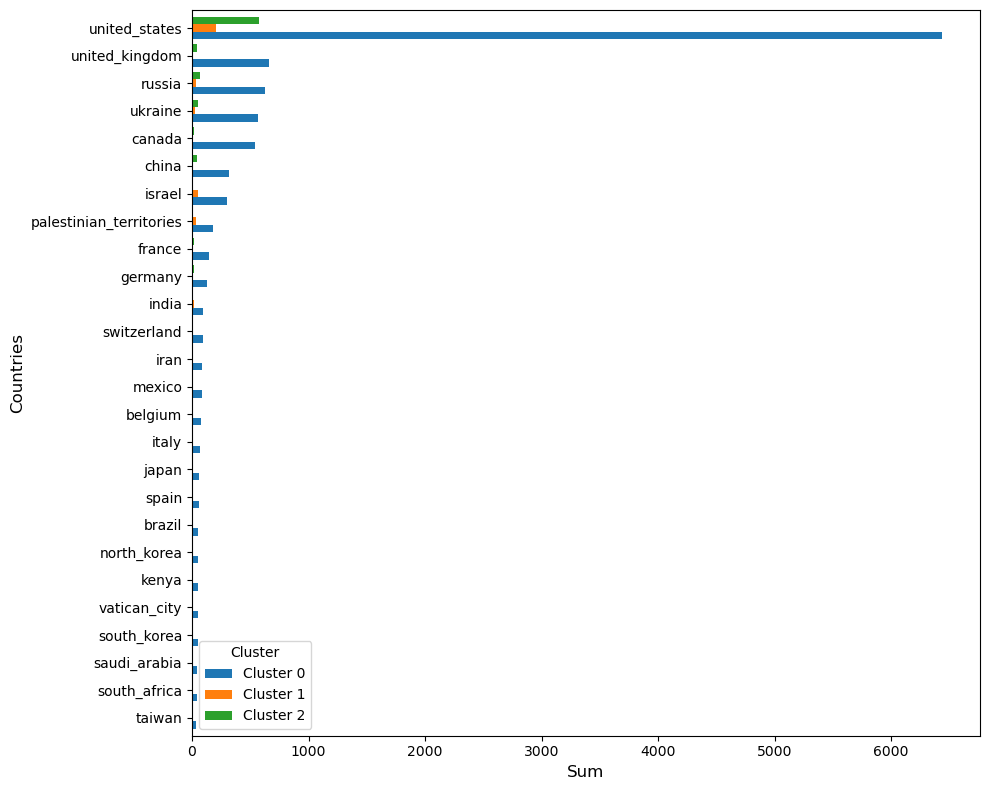

In [447]:
# Adjusting to select rows from 3 to 23 and plot horizontally
ax = combined_sum_df.iloc[29:55, :].sort_values(by='Cluster 0', ascending=True).plot(kind='barh', figsize=(10, 8), width=0.8)

# Setting labels and title (switching x and y labels because it's a horizontal plot)
ax.set_ylabel('Countries', fontsize=12)  # Now the y-axis represents categories
ax.set_xlabel('Sum', fontsize=12)  # x-axis represents the sum
#ax.set_title('Sum of Categories by Cluster for Rows 3 to 23', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

# Adjusting ticks on the y-axis
plt.yticks()  # No need for rotation as it's a horizontal plot

plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

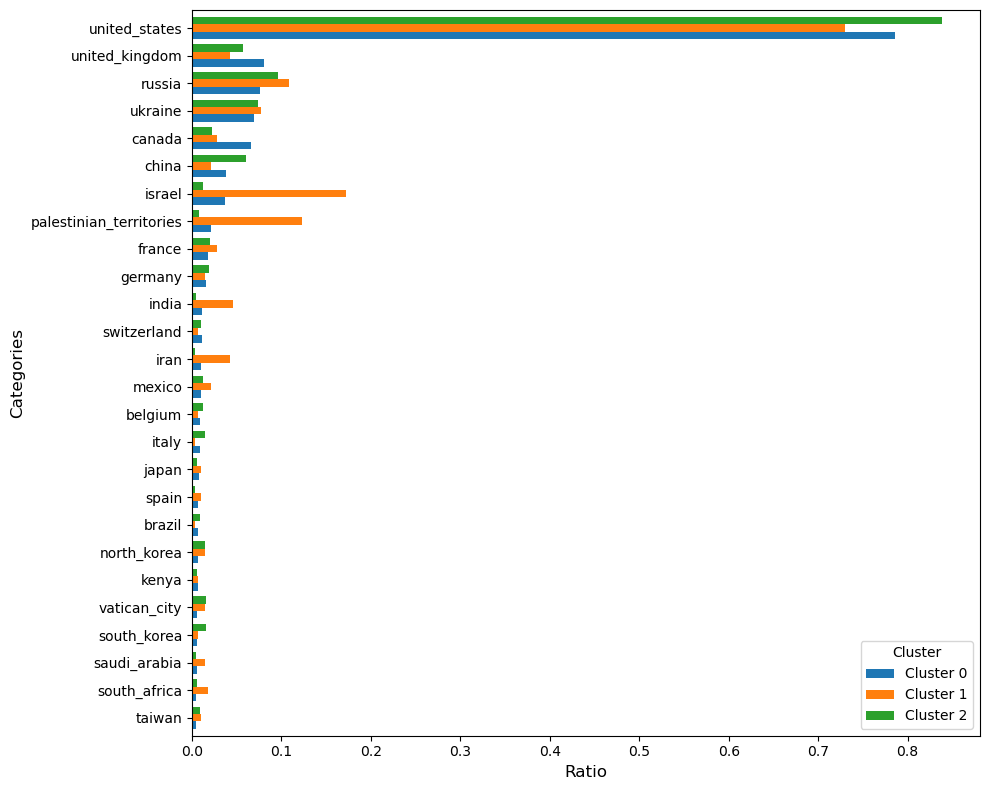

In [448]:
# Adjusting to select rows from 3 to 23 and plot horizontally
ax = combined_ratio_df.iloc[29:55, :].sort_values(by='Cluster 0', ascending=True).plot(kind='barh', figsize=(10, 8), width=0.8)

# Setting labels and title (switching x and y labels because it's a horizontal plot)
ax.set_ylabel('Categories', fontsize=12)  # Now the y-axis represents categories
ax.set_xlabel('Ratio', fontsize=12)  # x-axis represents the sum
#ax.set_title('Sum of Categories by Cluster for Rows 3 to 23', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

# Adjusting ticks on the y-axis
plt.yticks()  # No need for rotation as it's a horizontal plot

plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

#### Tone

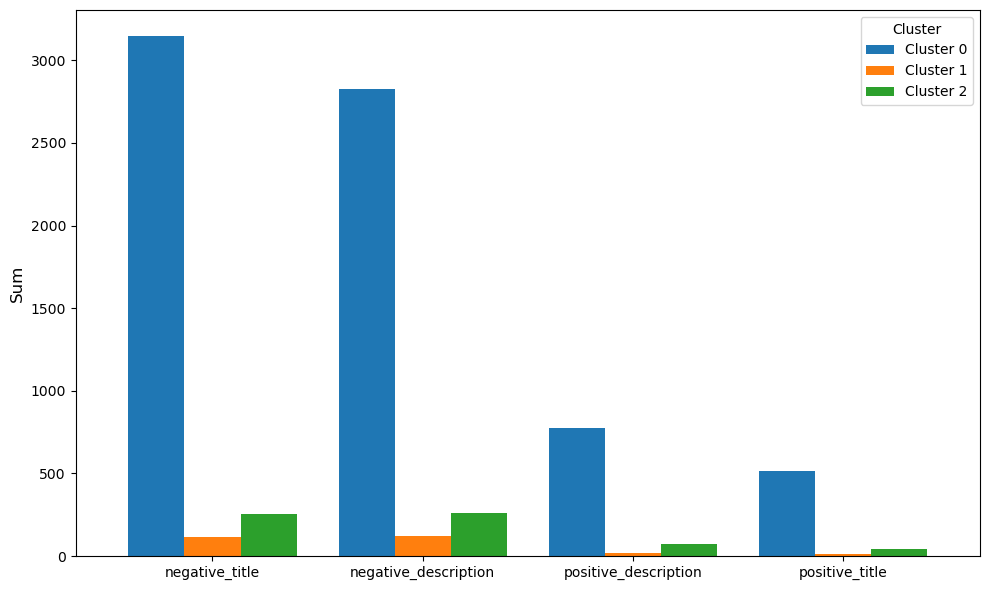

In [449]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_sum_df.iloc[55:59, :].sort_values(by='Cluster 0', ascending=False).plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
#ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Sum', fontsize=12)
#ax.set_title('Sum of Categories by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

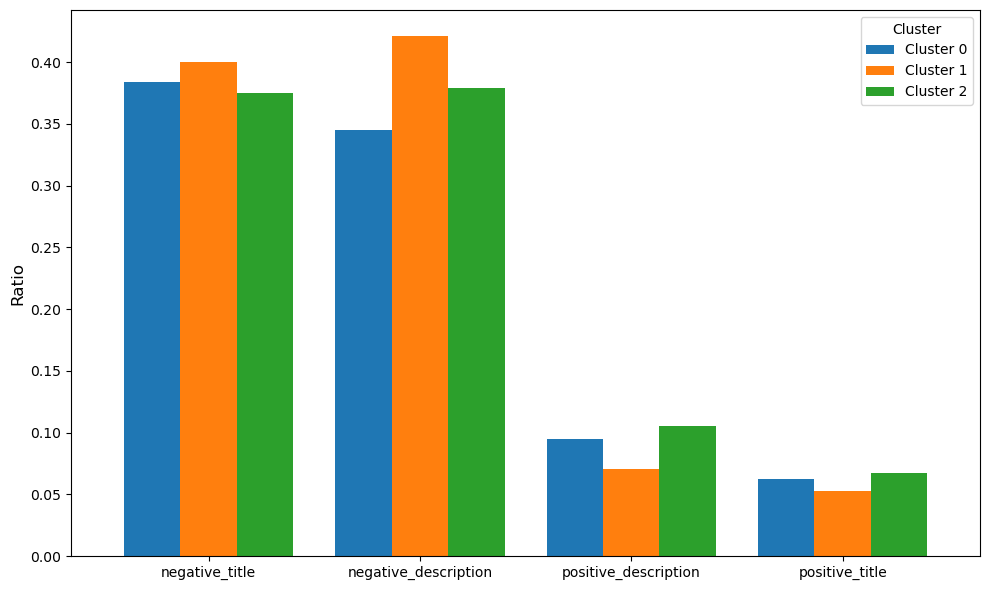

In [450]:
# Assuming combined_df is defined and contains the columns "Cluster 0", "Cluster 1", "Cluster 2"

# Plotting
ax = combined_ratio_df.iloc[55:59, :].sort_values(by='Cluster 0', ascending=False).plot(kind='bar', figsize=(10, 6), width=0.8)

# Setting labels and title
#ax.set_xlabel('Categories', fontsize=12)
ax.set_ylabel('Ratio', fontsize=12)
#ax.set_title('Sum of Categories by Cluster', fontsize=14)

# Adding legend
ax.legend(title='Cluster')

plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to not cut off labels

plt.show()

### Pero qué pasa con el eje izquierda-derecha?

Hemos visto en qué se diferencian a grandes rasgos los diferentes clusters. Podríamos decir que lo principal a tenor de lo encontrado es que:
    
El cluster 0 reúne a muchas noticias, la mayoría, que no son de las más destacadas. Ahí encontramos también la gran mayoría de "puntos ciegos" a izquierda y derecha (y también todos los "puntos ciegos absolutos").

El cluster 1 reúne a noticias de impacto, en las que encontramos la proporción más alta de noticias de última hora, noticias que terminan siendo titulares.

El cluster 2 reúne noticias diversas, en promedio con una tendencia a ser noticias de menos impacto, y también con tendencia a ser noticias algo más positivas (acaso por el "tirón" de las noticias del apartado "entertainment").

Pero si la premisa inicial no se ha desvelado el factor principal, sí que podemos revisar el cluster 0, donde hemos descubierto que se encuentran la gran mayoría de puntos ciegos.

### ¿Qué pasa con los puntos ciegos?

In [ ]:
Centrémonos en los puntos ciegos destacados por la propia web Ground News:

In [ ]:
ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 0].describe()

In [375]:
ground_news_cluster_interpretation_df[
    (ground_news_cluster_interpretation_df['Clusters k-means'] == 0) & 
    (ground_news_cluster_interpretation_df['highlighted_blindspot'] == 1)
]

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
15,-2.682322,-0.148549,3.420280,-1.253936,6.0,9.0,0.0,0.0,100.0,1.0,5.0,1.0,2.0,1.0,0.0,3.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
16,-2.050389,-0.534630,-0.065332,-0.127049,18.0,24.0,56.0,33.0,11.0,1.0,3.0,16.0,4.0,1.0,1.0,11.0,0.0,0.0,4.0,1.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31,-1.827201,0.280880,5.320998,-2.593315,12.0,13.0,0.0,0.0,100.0,4.0,8.0,0.0,1.0,0.0,0.0,3.0,3.0,0.0,4.0,1.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
47,-2.748366,0.113667,2.555649,-0.965688,8.0,11.0,13.0,12.0,75.0,1.0,4.0,3.0,3.0,0.0,0.0,4.0,2.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
48,-0.930325,-1.462784,-0.532763,0.793486,21.0,25.0,57.0,33.0,10.0,0.0,12.0,9.0,4.0,3.0,3.0,7.0,7.0,0.0,3.0,3.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9152,-0.730590,5.847799,-2.191053,0.171046,18.0,19.0,39.0,55.0,6.0,0.0,1.0,17.0,1.0,0.0,5.0,13.0,3.0,0.0,1.0,0.0,7.0,0.0,0.0,1.0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9161,-2.754381,0.350393,3.976699,-2.064873,6.0,9.0,0.0,17.0,83.0,3.0,2.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9163,-2.456068,-0.225655,2.316597,-0.970067,9.0,10.0,0.0,33.0,67.0,1.0,8.0,0.0,1.0,0.0,0.0,3.0,2.0,0.0,2.0,3.0,0.0,0.0,0.0,1.0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9166,-2.551632,-0.527076,0.308790,1.536547,9.0,9.0,100.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Esto nos deja con 815 filas, ¿y qué nos dicen, si tratamos de discernir entre izquierda y derecha?

#### Blindspots izquierda

In [376]:
blindspots_izquierda = ground_news_cluster_interpretation_df[
    (ground_news_cluster_interpretation_df['Clusters k-means'] == 0) & 
    (ground_news_cluster_interpretation_df['highlighted_blindspot'] == 1) & 
    (ground_news_cluster_interpretation_df['pct_left'] < ground_news_cluster_interpretation_df['pct_right'])
]

In [406]:
blindspots_izquierda

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
15,-2.682322,-0.148549,3.420280,-1.253936,6.0,9.0,0.0,0.0,100.0,1.0,5.0,1.0,2.0,1.0,0.0,3.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
31,-1.827201,0.280880,5.320998,-2.593315,12.0,13.0,0.0,0.0,100.0,4.0,8.0,0.0,1.0,0.0,0.0,3.0,3.0,0.0,4.0,1.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
47,-2.748366,0.113667,2.555649,-0.965688,8.0,11.0,13.0,12.0,75.0,1.0,4.0,3.0,3.0,0.0,0.0,4.0,2.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
64,-2.253589,0.342144,4.718356,-2.153430,13.0,15.0,0.0,0.0,100.0,3.0,8.0,2.0,1.0,0.0,0.0,5.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
94,-1.833860,0.228873,4.777673,-0.977168,9.0,15.0,0.0,11.0,89.0,3.0,5.0,0.0,6.0,0.0,0.0,0.0,2.0,3.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9046,-2.128638,-0.417001,2.121338,-0.173264,10.0,17.0,20.0,20.0,60.0,1.0,5.0,4.0,7.0,1.0,1.0,3.0,2.0,1.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9119,-1.163046,-0.098321,3.282268,-2.352971,20.0,21.0,10.0,40.0,50.0,4.0,7.0,8.0,2.0,0.0,0.0,4.0,5.0,0.0,5.0,3.0,0.0,0.0,0.0,1.0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
9146,-2.898663,0.310928,4.134505,-1.518207,7.0,10.0,0.0,0.0,100.0,2.0,3.0,2.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9161,-2.754381,0.350393,3.976699,-2.064873,6.0,9.0,0.0,17.0,83.0,3.0,2.0,1.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0


In [415]:
blindspots_izquierda.iloc[:,29:50].sum()

politics          378
social             90
religion           12
economy            55
technology         23
international      29
war                73
medicine           22
entertainment      75
leisure             2
sports              6
crime              21
police             15
science             4
justice            12
environment        12
internet_media     26
offbeat             3
disasters           7
opinion            10
contentious       157
dtype: int64

In [382]:
blindspots_izquierda['all_sources'].nlargest(10).index

Index([2753, 8004, 8057, 4664, 6172, 1742, 2471, 6221, 8355, 1278], dtype='int64')

In [383]:
blindspots_izquierda['all_sources'].nlargest(10)

2753    46.0
8004    42.0
8057    41.0
4664    39.0
6172    38.0
1742    34.0
2471    33.0
6221    32.0
8355    32.0
1278    30.0
Name: all_sources, dtype: float64

In [385]:
blindspots_izquierda.loc[blindspots_izquierda['all_sources'].nlargest(10).index]

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
2753,-0.792809,-0.336403,2.676825,1.050988,15.0,46.0,13.0,7.0,80.0,0.0,9.0,5.0,32.0,0.0,0.0,10.0,5.0,3.0,3.0,3.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8004,-0.281485,1.009957,3.475480,0.709589,20.0,42.0,25.0,10.0,65.0,2.0,12.0,6.0,22.0,0.0,1.0,7.0,3.0,5.0,3.0,1.0,1.0,0.0,0.0,1.0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8057,-0.460696,0.335800,4.456451,-1.230768,19.0,41.0,21.0,11.0,68.0,4.0,12.0,3.0,22.0,0.0,1.0,12.0,5.0,2.0,3.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4664,-0.890798,0.004070,3.282642,-1.171039,34.0,39.0,12.0,11.0,77.0,2.0,12.0,18.0,7.0,0.0,0.0,20.0,2.0,2.0,4.0,1.0,0.0,0.0,0.0,1.0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
6172,-1.051456,0.012347,2.099341,-0.696597,25.0,38.0,12.0,28.0,60.0,1.0,17.0,8.0,12.0,0.0,3.0,17.0,4.0,1.0,3.0,0.0,0.0,0.0,0.0,1.0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
1742,-0.037191,0.249071,6.136663,-3.961239,27.0,34.0,11.0,26.0,63.0,8.0,9.0,9.0,8.0,0.0,2.0,6.0,5.0,0.0,3.0,3.0,0.0,0.0,0.0,1.0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2471,1.757799,-3.537634,2.889852,1.216189,21.0,33.0,14.0,29.0,57.0,2.0,15.0,4.0,12.0,2.0,3.0,11.0,1.0,3.0,5.0,25.0,0.0,0.0,0.0,1.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
6221,0.164238,1.862296,3.668533,-0.939460,27.0,32.0,22.0,8.0,70.0,3.0,19.0,4.0,6.0,0.0,2.0,17.0,8.0,2.0,3.0,1.0,2.0,0.0,0.0,1.0,0,0,1,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8355,-0.889898,-0.061023,1.710054,0.827380,22.0,32.0,18.0,32.0,50.0,0.0,15.0,7.0,9.0,0.0,2.0,6.0,7.0,4.0,4.0,1.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
1278,0.401078,-1.424431,3.957235,-0.392772,20.0,30.0,15.0,30.0,55.0,4.0,6.0,10.0,10.0,2.0,1.0,3.0,3.0,4.0,3.0,10.0,0.0,0.0,0.0,1.0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


¿Y cuáles son esas noticias que son punto ciego de la izquierda? Veamos el top veinte.

In [387]:
# Cargamos de nuevo el dataframe con los títulos de las noticias.
ground_news_df = pd.read_pickle('ground_news_df.pkl')

In [420]:
top_blind_izquierda = ground_news_df.loc[blindspots_izquierda['all_sources'].nlargest(10).index, ['title', 'subject']]
for index, row in top_blind_izquierda.iterrows():
    print(row['title'])
    # print(row['subject']) # Podríamos ver los temas si quisiéramos.

Russia says it carried out hypersonic missile exercises using a frigate in the Atlantic
Canada's defence minister says Hamas a threat to world, must be 'eliminated'
Israeli military says it can't guarantee journalists' safety in Gaza
Supreme Court Justice Stevens' private papers open to public
Who is Carlos De Oliveira, Trump’s Mar-a-Lago resort manager?
Yankees-Guardians playoff game postponed due to bad weather
Supreme Court takes 8 new cases, including mailman's religious claim
SUV hits 6 migrant workers at NC Walmart and it ‘appears to be’ intentional, cops say
NYC Mayor Eric Adams sets up legal defense fund amid corruption investigation
Joe Rogan explains why he’s not a Republican, crudely mocks critics who consider him a 'secret conservative'


#### Blindspots derecha

In [ ]:
blindspots_derecha.loc[blindspots_derecha['all_sources'].nlargest(10).index]

In [379]:
blindspots_derecha = ground_news_cluster_interpretation_df[
    (ground_news_cluster_interpretation_df['Clusters k-means'] == 0) & 
    (ground_news_cluster_interpretation_df['highlighted_blindspot'] == 1) & 
    (ground_news_cluster_interpretation_df['pct_left'] > ground_news_cluster_interpretation_df['pct_right'])
]

In [380]:
blindspots_derecha

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
16,-2.050389,-0.534630,-0.065332,-0.127049,18.0,24.0,56.0,33.0,11.0,1.0,3.0,16.0,4.0,1.0,1.0,11.0,0.0,0.0,4.0,1.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
48,-0.930325,-1.462784,-0.532763,0.793486,21.0,25.0,57.0,33.0,10.0,0.0,12.0,9.0,4.0,3.0,3.0,7.0,7.0,0.0,3.0,3.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
65,-2.979783,-0.579055,-0.752281,0.711348,6.0,6.0,50.0,50.0,0.0,0.0,3.0,3.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
95,-2.271759,-0.862451,-0.205913,1.371504,11.0,12.0,73.0,18.0,9.0,0.0,7.0,4.0,0.0,1.0,2.0,1.0,4.0,0.0,1.0,4.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
112,-1.017644,-1.225924,-0.897537,0.405747,21.0,31.0,48.0,47.0,5.0,0.0,9.0,12.0,10.0,2.0,1.0,16.0,4.0,0.0,5.0,3.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9114,-2.105736,-0.153196,0.176552,-0.357862,18.0,24.0,39.0,44.0,17.0,1.0,2.0,15.0,6.0,0.0,2.0,12.0,4.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9134,0.368081,-1.035650,-1.642488,-0.369867,56.0,91.0,29.0,64.0,7.0,0.0,2.0,54.0,35.0,1.0,0.0,34.0,5.0,0.0,3.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9152,-0.730590,5.847799,-2.191053,0.171046,18.0,19.0,39.0,55.0,6.0,0.0,1.0,17.0,1.0,0.0,5.0,13.0,3.0,0.0,1.0,0.0,7.0,0.0,0.0,1.0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9166,-2.551632,-0.527076,0.308790,1.536547,9.0,9.0,100.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [381]:
blindspots_derecha['all_sources'].nlargest(10).index

Index([8496, 9134, 8690, 9097, 8462, 8247, 3052, 3211, 4665, 5183], dtype='int64')

In [384]:
blindspots_derecha.loc[blindspots_derecha['all_sources'].nlargest(10).index]

,PC1,PC2,PC3,PC4,bias_num_sources,all_sources,pct_left,pct_centre,pct_right,low_fact,mixed_fact,high_fact,unknown_fact,own_telecom,own_privateEquity,own_mediaConglomerate,own_billionaire,own_government,own_independent,own_other,own_corporation,top_story,breaking_story,highlighted_blindspot,es_finde,season_invierno,season_otoño,season_primavera,season_verano,politics,social,religion,economy,technology,international,war,medicine,entertainment,leisure,sports,crime,police,science,justice,environment,internet_media,offbeat,disasters,opinion,contentious,united_states,russia,united_kingdom,ukraine,canada,china,israel,palestinian_territories,france,germany,india,switzerland,iran,mexico,belgium,italy,japan,north_korea,vatican_city,south_korea,spain,saudi_arabia,south_africa,taiwan,brazil,kenya,positive_description,negative_description,positive_title,negative_title,Clusters k-means
8496,2.547327,-1.464003,-1.356624,-0.912826,82.0,97.0,35.0,59.0,6.0,1.0,8.0,72.0,16.0,0.0,13.0,50.0,13.0,1.0,2.0,8.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9134,0.368081,-1.035650,-1.642488,-0.369867,56.0,91.0,29.0,64.0,7.0,0.0,2.0,54.0,35.0,1.0,0.0,34.0,5.0,0.0,3.0,2.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
8690,1.796902,-1.780414,-0.668054,-0.027879,56.0,80.0,39.0,50.0,11.0,1.0,6.0,48.0,25.0,1.0,9.0,29.0,10.0,1.0,4.0,9.0,0.0,0.0,0.0,1.0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9097,1.609178,-1.981826,-2.130926,-1.535322,65.0,71.0,23.0,69.0,8.0,0.0,4.0,61.0,6.0,1.0,11.0,29.0,7.0,0.0,14.0,8.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8462,1.347067,-1.876239,0.036757,0.372455,46.0,67.0,50.0,33.0,17.0,1.0,15.0,30.0,21.0,2.0,5.0,18.0,11.0,0.0,4.0,8.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8247,-0.690539,-0.677637,-1.149369,-0.034904,46.0,66.0,48.0,41.0,11.0,0.0,5.0,41.0,20.0,1.0,5.0,22.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
3052,-1.166223,-1.124319,-0.823183,1.740176,23.0,64.0,70.0,26.0,4.0,0.0,1.0,22.0,41.0,2.0,0.0,5.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3211,-1.358414,-0.903562,-0.383057,1.683724,23.0,59.0,70.0,17.0,13.0,0.0,1.0,22.0,36.0,1.0,0.0,6.0,2.0,0.0,0.0,3.0,0.0,0.0,0.0,1.0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4665,-1.142502,-0.448957,-0.949934,0.122767,35.0,56.0,46.0,45.0,9.0,0.0,4.0,31.0,21.0,0.0,2.0,17.0,3.0,0.0,4.0,1.0,0.0,0.0,0.0,1.0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,-0.808000,1.516610,-0.843144,1.217328,36.0,56.0,61.0,31.0,8.0,0.0,3.0,33.0,20.0,0.0,0.0,12.0,3.0,2.0,2.0,0.0,2.0,0.0,0.0,1.0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


¿Cuáles son los diez titulares de los blindspots más importantes de la derecha?

In [421]:
top_blind_derecha = ground_news_df.loc[blindspots_derecha['all_sources'].nlargest(10).index, ['title', 'subject']]
for index, row in top_blind_derecha.iterrows():
    print(row['title'])
    # print(row['subjects'])

UBS sees shift in new billionaires away from entrepreneurs to inherited wealth
Russell Crowe says he is descendant of last man executed by beheading in England
House formally approves Biden impeachment inquiry
Pa. man suspected of killing wife arrested at Las Vegas casino
Rosalynn and Jimmy Carter were not only a global power couple but also best friends and life mates
Texas prisoner set for execution says sentence is based on false testimony
New Mexico State men's basketball team cancels season after sex, harassment allegations
CCTV Footage Shows Alligator Dragging Florida Woman to Her Death
US to end COVID-19 vaccination requirements on May 11 -White House
Debt ceiling bill clears key hurdle in the House, teeing up final vote


#### Blindspots de izquierda vs. derecha

Por temas, blindspots de la izquierda:

In [430]:
blindspots_izquierda.iloc[:,29:50].sum()

politics          378
social             90
religion           12
economy            55
technology         23
international      29
war                73
medicine           22
entertainment      75
leisure             2
sports              6
crime              21
police             15
science             4
justice            12
environment        12
internet_media     26
offbeat             3
disasters           7
opinion            10
contentious       157
dtype: int64

Tono de las noticias que la izquierda no ve:

In [438]:
blindspots_izquierda.iloc[:, -5:-1].sum()

positive_description     22
negative_description    119
positive_title           14
negative_title          156
dtype: int64

Por temas, blindspots de la derecha:

In [431]:
blindspots_derecha.iloc[:,29:50].sum()

politics          391
social             95
religion            5
economy            41
technology         14
international      21
war                29
medicine           33
entertainment      74
leisure             2
sports              7
crime              33
police             25
science             5
justice            65
environment        19
internet_media     13
offbeat             1
disasters          11
opinion             6
contentious       157
dtype: int64

In [ ]:
Tono de las noticias que la derecha no ve:

In [439]:
blindspots_derecha.iloc[:, -5:-1].sum()

positive_description     33
negative_description    138
positive_title           25
negative_title          151
dtype: int64

Hagamos una última representación gráfica:

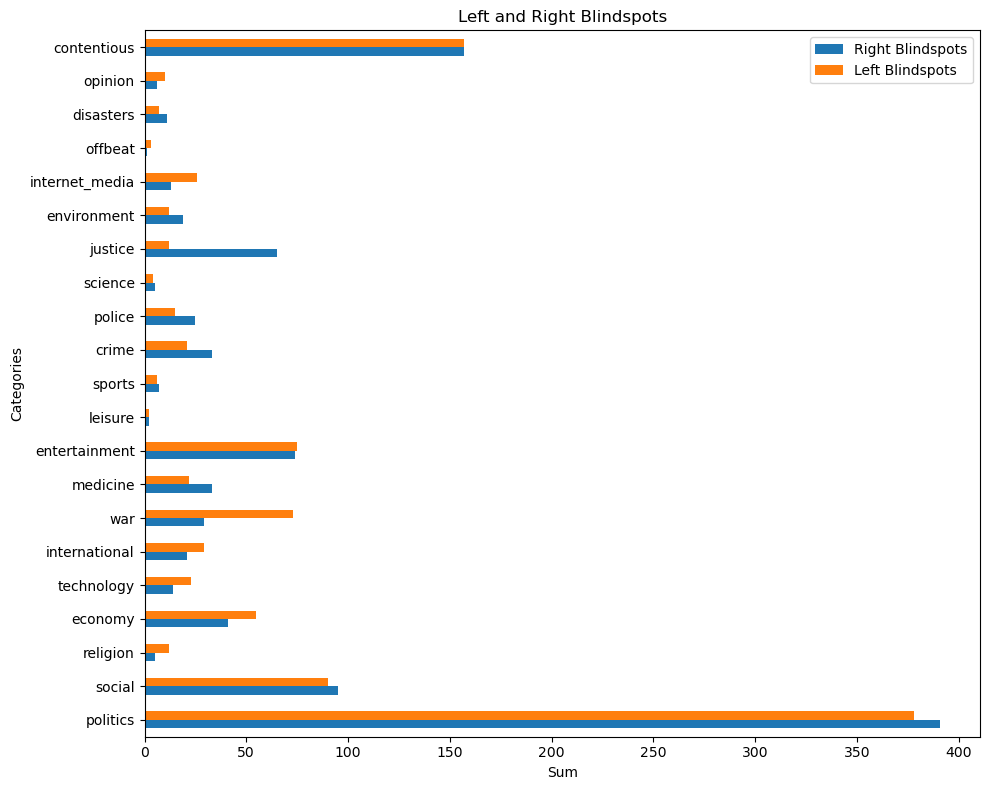

In [428]:
import matplotlib.pyplot as plt

# Assuming the data dictionary is already defined and comparison_df created
data = {
    'Right Blindspots': blindspots_derecha.iloc[:,29:50].sum(),
    'Left Blindspots': blindspots_izquierda.iloc[:,29:50].sum()
}
comparison_df = pd.DataFrame(data)

# Plotting using the DataFrame as a horizontal bar plot
comparison_df.plot(kind='barh', figsize=(10, 8))  # Changed to 'barh' for horizontal bars

plt.ylabel('Categories')  # Adjusted for horizontal plot
plt.xlabel('Sum')  # Adjusted for horizontal plot
plt.title('Left and Right Blindspots')
plt.legend()
plt.tight_layout()  # Adjust layout

plt.show()


Después de revisar esta representación podemos deducir, sobre las diferencias entre los temas tratados entre izquierda y derecha, con los datos que tenemos es esta:

a) La cobertura por parte de medios de izquierda (en este dataset) de temas relacionados con la guerra, y en menor medida la economía, ha sido más frecuentemente un punto ciego de la izquierda más que en la derecha.

b) Por su parte, en los medios de derecha, Ground News ha destacado como punto ciego los temas relacionados con la justicia.

En todo caso, en ambos caso, siendo el tema más recurrente, para ambos bandos la mayoría de sus puntos ciegos estaban encuadrados dentro del ámbito de la política. Es llamativo que aunque ha sido elaborado de forma manual y subjetiva, el segundo elemento más recurrente en estos "puntos ciegos" es lo que hemos marcado como temas "controvertidos".

#### Iluminación de última hora: sumar el & de cobertura izquierda/centro/derecha para estimar diferencias groseras en los clusters

In [459]:
pd.DataFrame([ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 0][['pct_left', 'pct_centre', 'pct_right']].sum().values], columns=['additive_pct_left', 'additive_pct_centre', 'additive_pct_right'])

,additive_pct_left,additive_pct_centre,additive_pct_right
0,278461.0,360211.0,181028.0


In [460]:
pd.DataFrame([ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 1][['pct_left', 'pct_centre', 'pct_right']].sum().values], columns=['additive_pct_left', 'additive_pct_centre', 'additive_pct_right'])

,additive_pct_left,additive_pct_centre,additive_pct_right
0,8586.0,13478.0,6436.0


In [461]:
pd.DataFrame([ground_news_cluster_interpretation_df[ground_news_cluster_interpretation_df['Clusters k-means'] == 2][['pct_left', 'pct_centre', 'pct_right']].sum().values], columns=['additive_pct_left', 'additive_pct_centre', 'additive_pct_right'])

,additive_pct_left,additive_pct_centre,additive_pct_right
0,20723.0,35002.0,12575.0
